<center>
<div style="font-family: 'Times New Roman', serif; text-align: center; font-size: 1.5em">
  <img src="https://image-tc.galaxy.tf/wipng-3jcsiz4vzvffnpa7dfizxcdbp/northeastern-university.png" alt="Northeastern University Logo" style="width: 200px; margin-bottom: 1em;">
  <br/>
  <br/>
  <br/>

  <h2 style="font-size: 2em; margin-bottom: 0.3em; font-weight: bold; text-align: center; text-decoration: underline overline"> Assignment 4 </h2>
  <h2 style="font-size: 1.5em; margin-bottom: 0.3em;">EAI6010  - Applications of Artificial Intelligence</h2>
  <h2 style="font-size: 1.5em; margin-bottom: 0.3em;">Mohammad Hossein Movahedi</h2>
  <h3 style="font-size: 1.2em; margin-bottom: 0.3em; font-style: italic;">Lecturer: Prof. Vladimir Shapiro</h3>
  <h3 style="font-size: 1em; margin-top: 2em; font-weight: bold; text-align: center;">Fall 2023</h3>
</div>
</center>

# **Introduction**

In this assignment, we embark on a two-part journey. The first part delves into image processing techniques, employing Python, Matplotlib for data preprocessing and visualization. The second part involves the development and evaluation of a Convolutional Neural Network (CNN) using TensorFlow and Matplotlib for classifying handwritten digits within the MNIST dataset. These dual segments offer a comprehensive exploration of practical applications in both image manipulation and machine learning tasks.

# **Body/Analysis**

## Part I

### **Introduction to Image Processing in Python**
An NCSU Libraries Workshop

Speaker: Nian Xiong

>This workshop provides an introduction to basic image processing techniques using the OpenCV computer vision library and some standard data analysis libraries in Python. Knowledge of image processing and Python programming is not required for this workshop, but will help.

*The source of this notebook is located at https://github.com/xn2333/OpenCV/blob/master/Seminar_Image_Processing_in_Python.ipynb*

*Useful intro about [Colab](https://colab.research.google.com/notebooks/welcome.ipynb)*

*Useful intro about [OpenCV](https://opencv.org/)*








###Step1: Load the Dependencies

> This section loads some required libraries used in this notebook: **numpy**, **pandas**, **cv2**, **skimage**, **PIL**, **matplotlib**

The code begins by importing essential libraries for data manipulation and image processing in Python. NumPy and Pandas are included for numerical operations and data analysis, while OpenCV (cv2) is imported for computer vision tasks. Additionally, the code incorporates modules for displaying images in a Google Colab environment, reading and writing images using scikit-image (io) and Python Imaging Library (PIL), and utilizing Matplotlib for plotting. This suggests a focus on image-related operations, with the potential for data analysis and visualization.

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image
import matplotlib.pylab as plt

###Step2: Read Image from Urls

The provided code snippet initiates a list 'urls' containing links to images. A loop iterates through these URLs, utilizing the scikit-image (io) library to read each image. The images are then converted from BGR to RGB color format using OpenCV (cv). Finally, the code horizontally concatenates the original and color-transformed images, displaying the results using 'cv2_imshow' from the Google Colab patches.

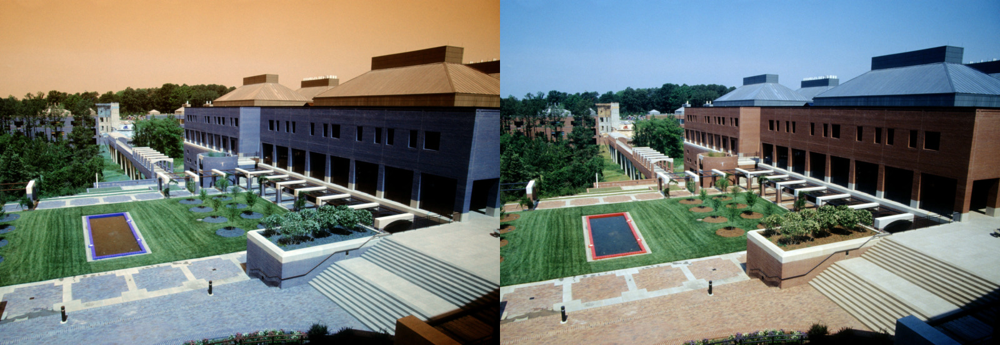

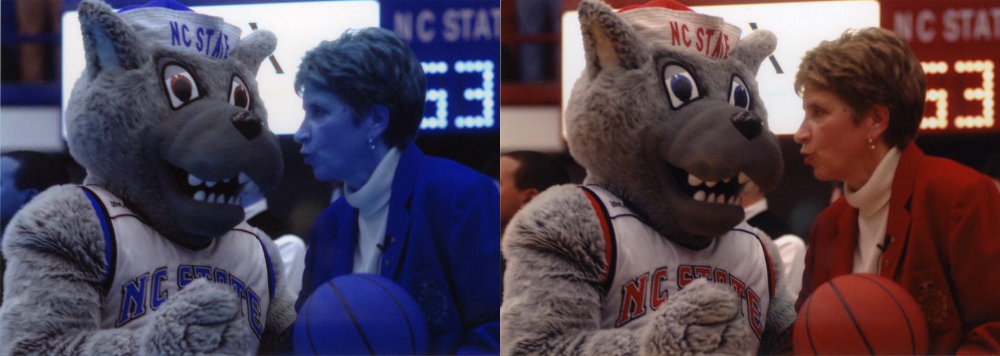

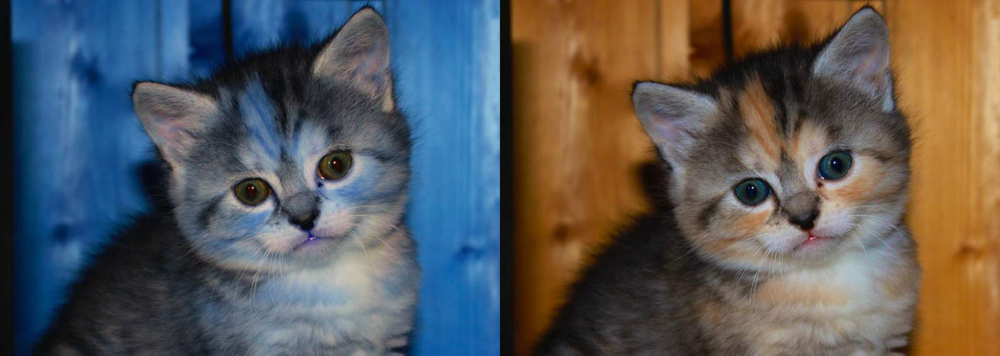

In [ ]:
# Create a list to store the urls of the images
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
      "https://placekitten.com/800/571"]
# Read and display the image
# loop over the image URLs, you could store several image urls in the list

for url in urls:
  image = io.imread(url)
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

#### TODO #1: Read an image from a URL and display it

Image source examples:

[Place Kitten](https://placekitten.com/) - use the base Place Kitten URL followed by a width and height separated by backslashes ''/''. For example, use the URL `https://placekitten.com/500/300` to fetch a cat image with a width of 500px and height of 300px.

[NC State University Libraries Special Collections](https://d.lib.ncsu.edu/collections/catalog) - browse the site to find an image thumbnail. Right-click on the thumbnail and select "Copy Image Address". The address will look like this: `https://iiif.lib.ncsu.edu/iiif/0051230/square/300,/0/default.jpg`. Replace the word "square" with the word "full" and replace "300" with "800" to access the full image at a width of 800px.

[Google Image search](https://www.google.com/imghp?hl=en) - search for an image. Left-click one of the returned images, then right-click on the full image, and then select "Copy Image Address".

The URL points to an image of Joe Biden's official portrait. The code employs scikit-image (io) to read the image and OpenCV (cv) to convert the color format from BGR to RGB. The resulting image is then displayed using 'cv2_imshow' from Google Colab patches.

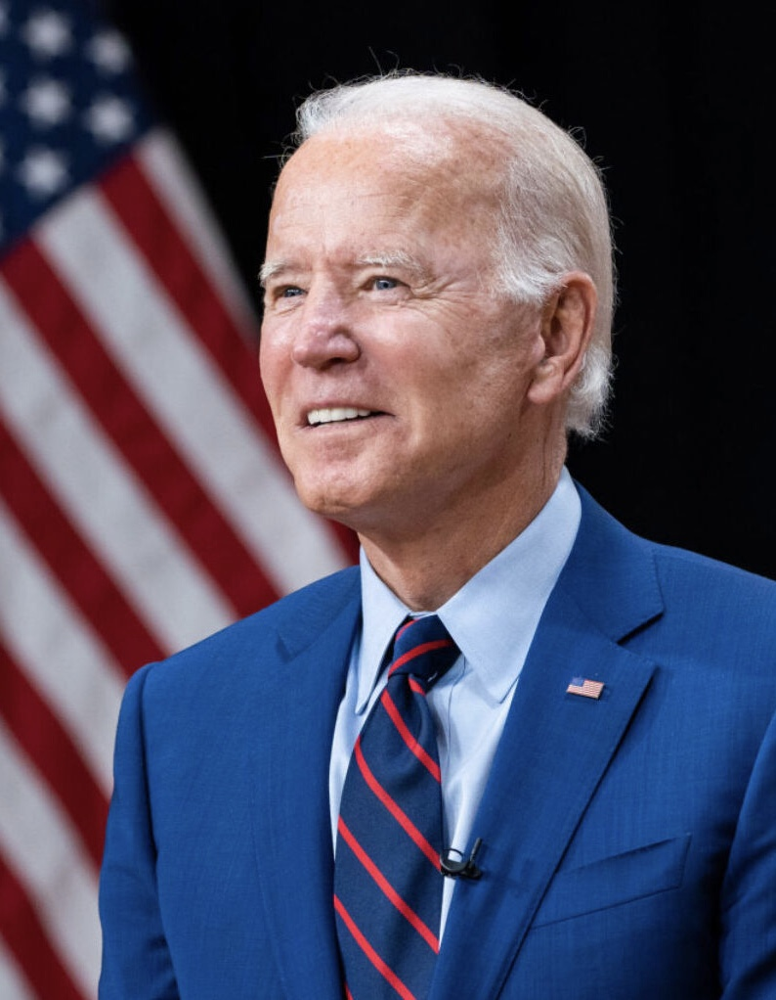

In [ ]:
## TODO: LOAD IMAGE
url = 'https://upload.wikimedia.org/wikipedia/commons/c/c9/Joe_Biden_official_portrait_2021_cropped.jpg'
myImg = io.imread(url)
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))


###Step3: Image Contours and Histograms

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
# Check the height of image
print(image.shape[0])
# Check the width of image
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
571
800
3


This code snippet systematically examines critical attributes of the loaded image. It begins by revealing the image's matrix data type, conveying the bit depth. Subsequently, it retrieves and prints the image's height and width, vital dimensions for spatial understanding. The last line determines and prints the number of channels, offering insights into the image's color representation.

#### Generate Histogram of color image and grayscale image
Sometimes you want to enhance the contrast in your image or expand the contrast in a particular region while sacrificing the detail in colors that don’t vary much, or don’t matter. A good tool to find interesting regions is the histogram. To create a histogram of our image data, we use the matplot.pylab `hist()` function.

More info: [Histogram](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_table_of_contents_histograms/py_table_of_contents_histograms.html)

Display the histogram of all the pixels in the color image

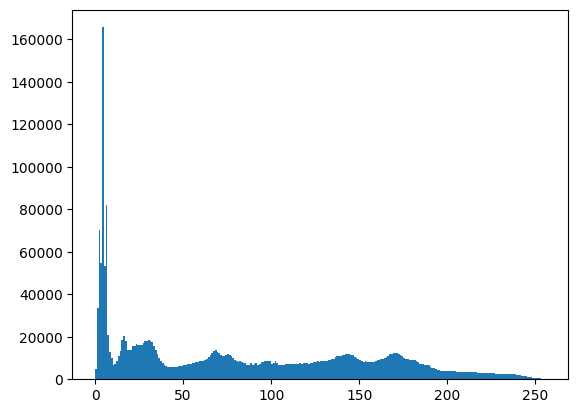

In [ ]:
plt.hist(myImg.ravel(),bins = 256, range = [0,256])
plt.show()

Display the histogram of R, G, B channel
We could observe that the green channel has many pixels in 255, which represents the white patch in the image

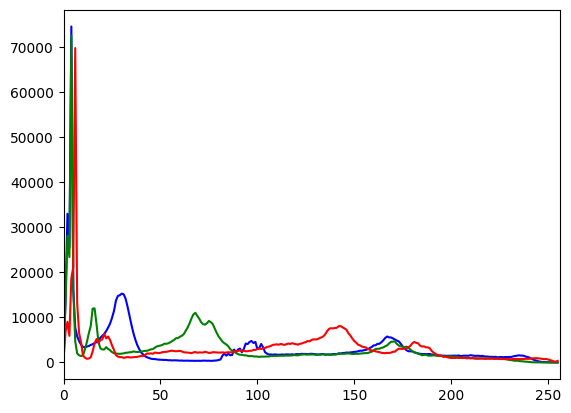

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([myImg],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

This code generates and displays color histograms for the blue, green, and red channels of the loaded image. The loop iterates over each channel, calculates the histogram using OpenCV, and plots it with the respective color using Matplotlib.

These fluctuations suggest areas of the image that lack or have minimal presence of the corresponding color. Such information can be valuable for understanding the image's composition, identifying dominant colors, and potentially detecting areas with low color intensity or saturation

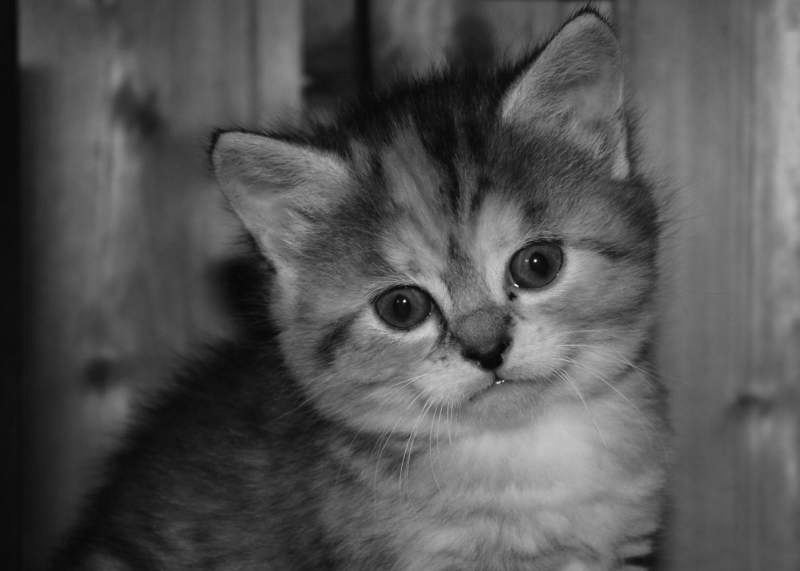

In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

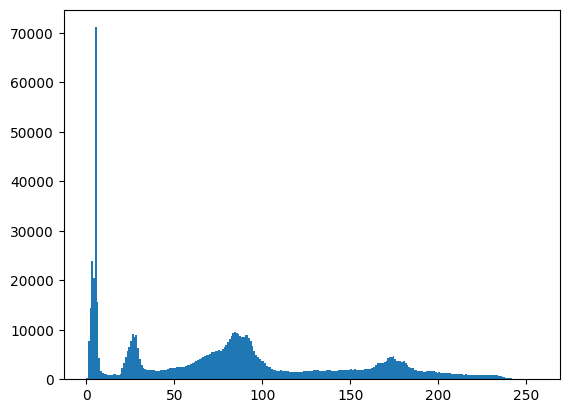

In [ ]:
# Plot the histogram of the gray image. We could observe that the frequency of
# the image hist has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

#### TODO # 2: DISPLAY THE GRAYSCALE OF YOUR COLOR IMAGE AND GENERATE HISTOGRAM


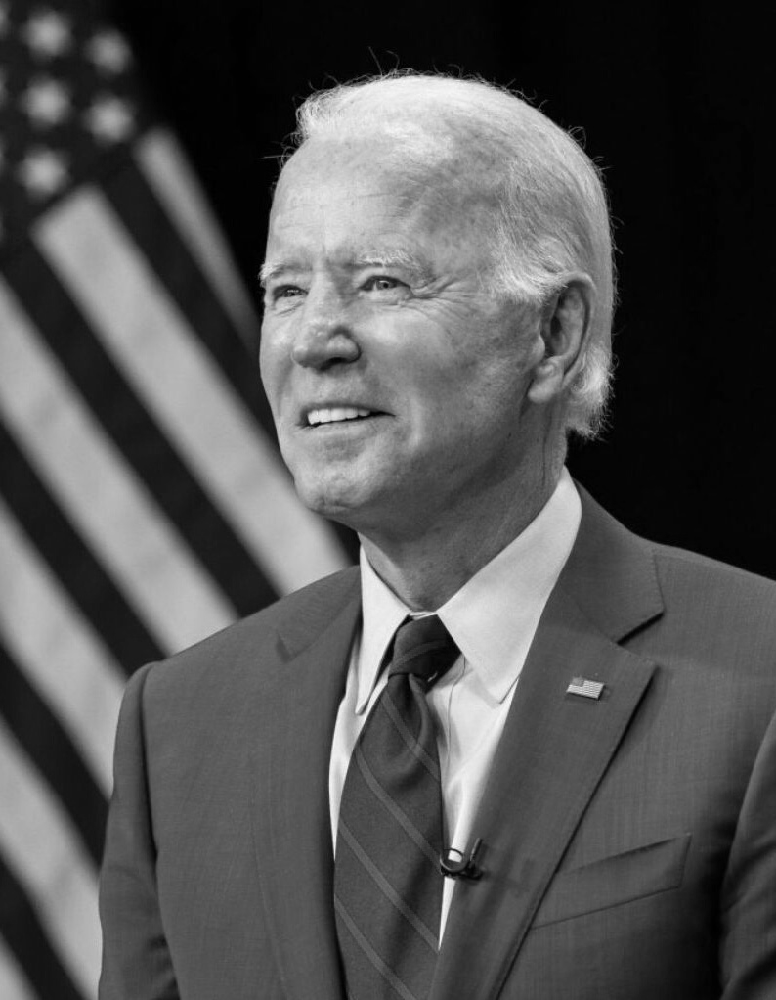

In [ ]:
myGrayImg = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
cv2_imshow(myGrayImg)

This code snippet converts the loaded color image (myImg) to grayscale (myGrayImg) using OpenCV. The converted grayscale image is then displayed using cv2_imshow. Converting an image to grayscale simplifies its representation by removing color information, resulting in a single-channel image where pixel intensities represent different shades of gray.

#### Find image contour of the grayscale image

Method 1: Use the matplotlib. contour

More Info: [matplotlib contour](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.contour.html)

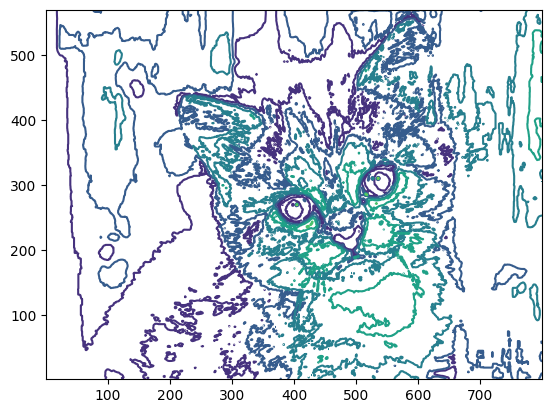

In [ ]:
plt.contour(gray_image, origin = "image")

Method 2: Use the openCV lib

More info: [Contour](https://docs.opencv.org/3.1.0/d4/d73/tutorial_py_contours_begin.html)

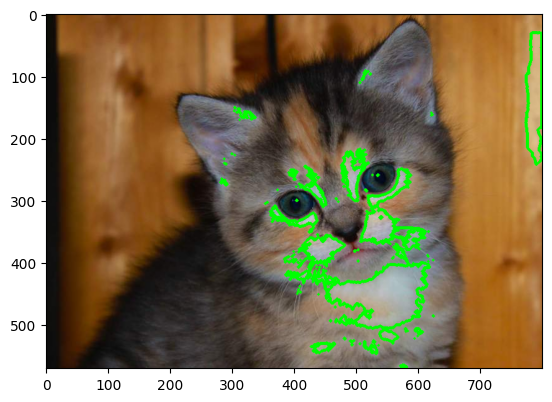

In [ ]:
# Set threshold for the countour detection
ret, thresh = cv.threshold(gray_image,150,255,0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(image, contours, -1, (0, 255, 0), 3)
plt.imshow(image)

#### TODO # 3: Find the contour of your own image

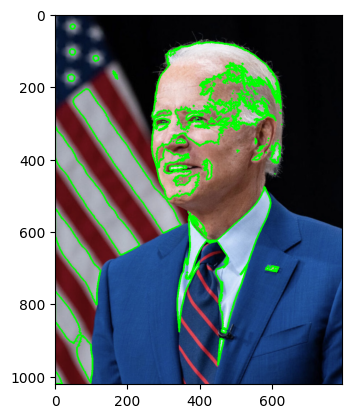

In [ ]:
# Set threshold for the countour detection
ret, thresh = cv.threshold(myGrayImg,150,255,0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(myImg, contours, -1, (0, 255, 0), 3)
plt.imshow(myImg)

This code establishes a threshold for contour detection on the grayscale image (myGrayImg). The cv.threshold function is used to create a binary image (thresh) by setting pixel values above the threshold (150) to 255 and the rest to 0. Contours are then identified using the cv.findContours function, and the contours are drawn on the original color image (myImg) using cv.drawContours. The resulting image with outlined contours is displayed using Matplotlib (plt.imshow). This process is common in image analysis to highlight and visualize distinct shapes or objects within an image.

####Step4: Grayscale Transform and Histogram Equalization


#### Grayscale Transformation
This section provides some examples of conducting mathematical transformations of the grayscale image

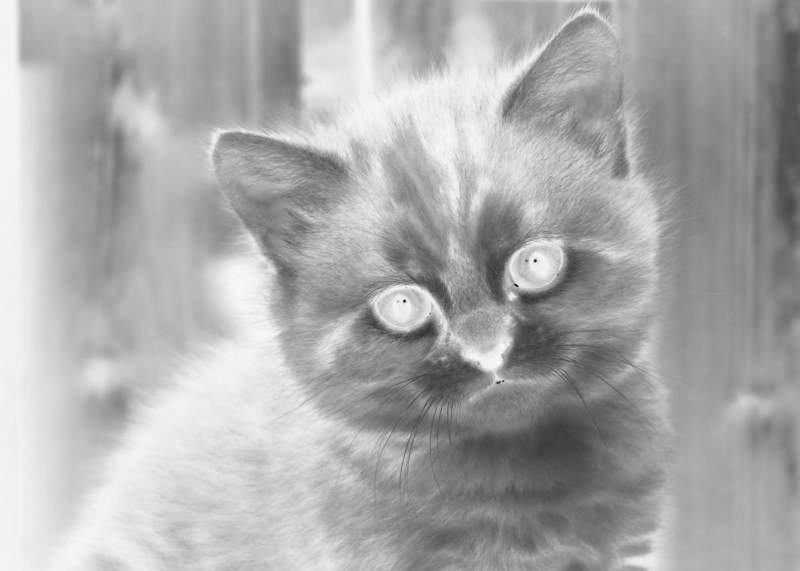

In [ ]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - gray_image
cv2_imshow(im2)

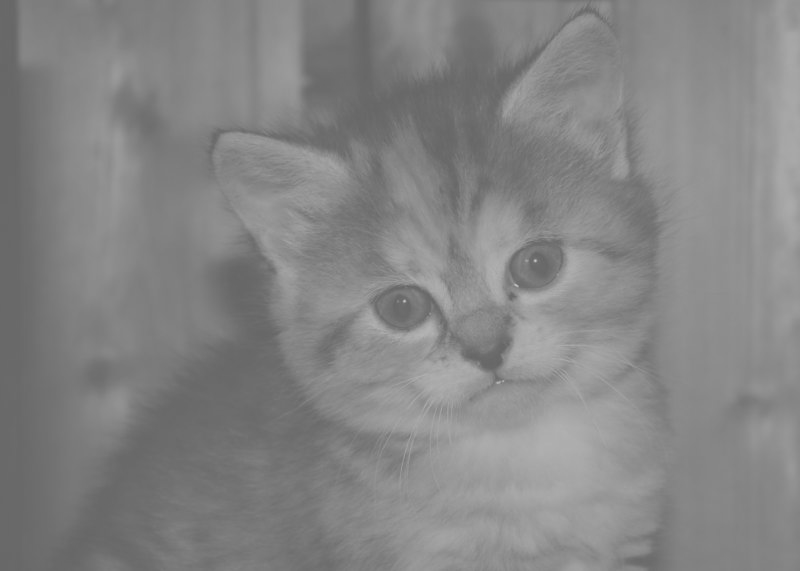

In [ ]:
# Another transform of the image, after adding a constant,
# all the pixels become brighter and a hazing-like effect of the image is generated
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

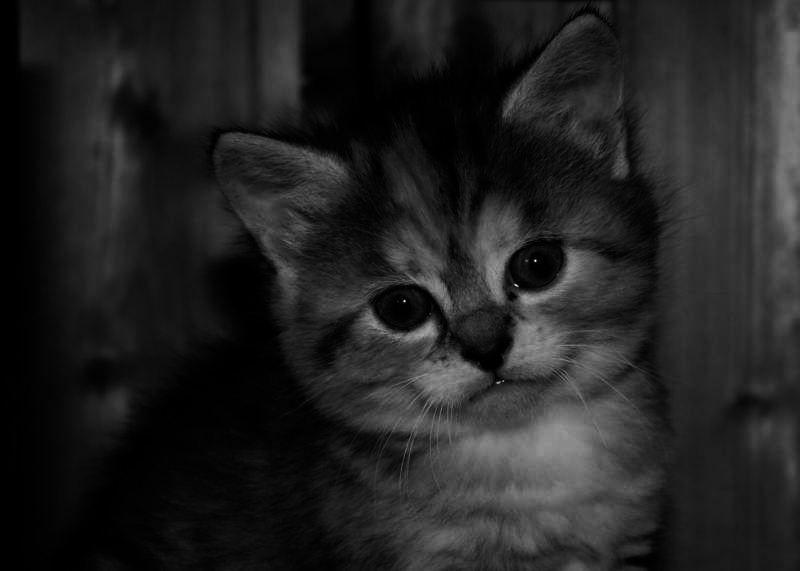

In [ ]:
# The lightness level of the gray_image decreases after this step
im4 = 255.0*(gray_image/255.0)**2
cv2_imshow(im4)

#### TODO #4:  Try some mathematical operations on your image


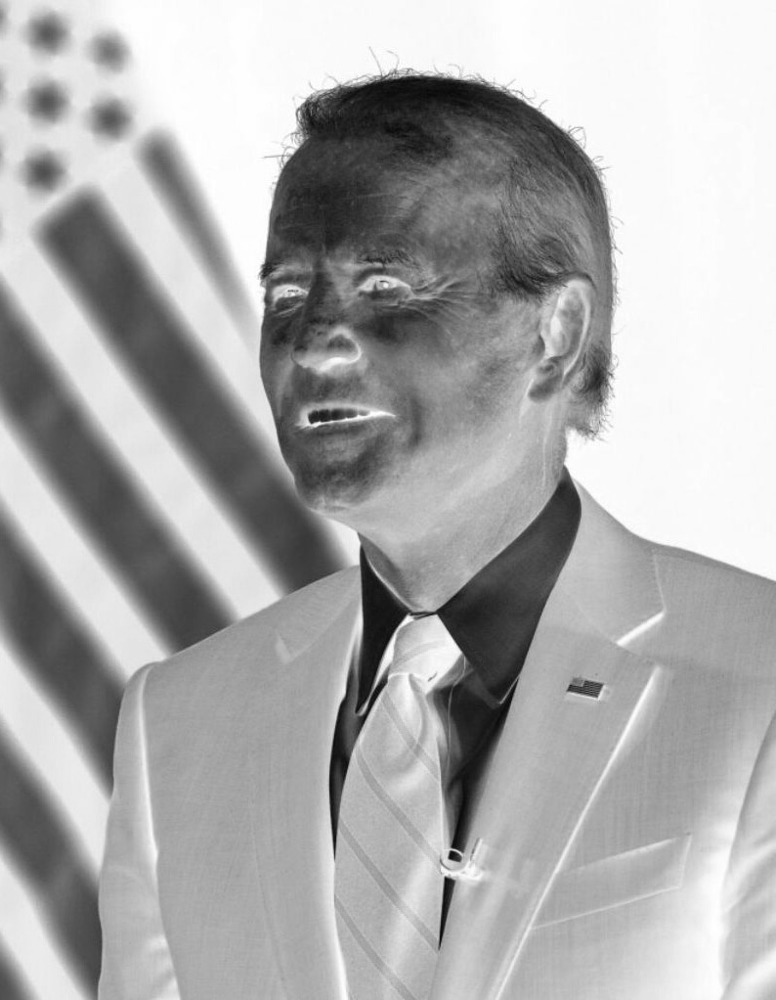

In [ ]:
## Implement your code here
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - myGrayImg
cv2_imshow(im2)


This code segment performs an image inversion operation on the grayscale image (myGrayImg). It transforms bright pixels to dark and vice versa by subtracting each pixel intensity from 255.

#### Histogram Equalization
This section demonstrates histogram equalization on a dark image. This transform flattens the gray-level histogram so that all intensities are as equally common as possible. The transform function is a cumulative distribution function (cdf) of the pixel values in the image (normalized to map the range of pixel values to the desired range). This example uses image 4 (im4).

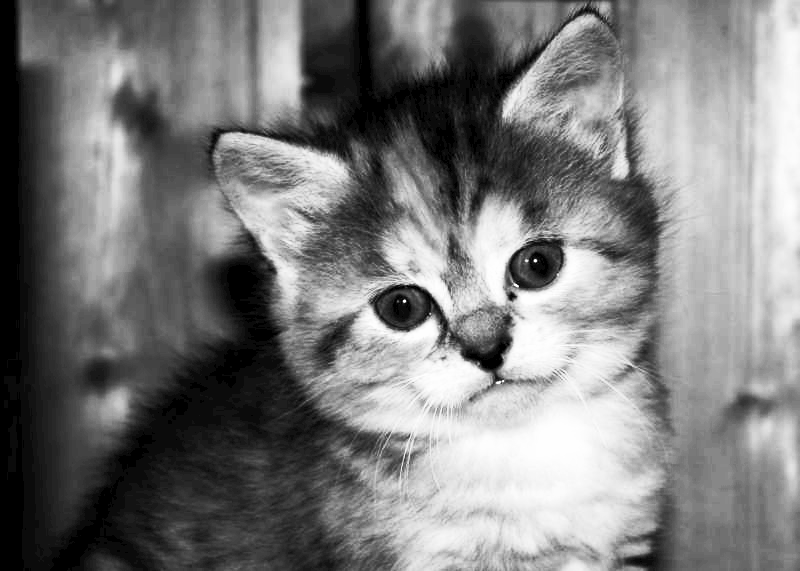

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im5 = histeq(im4)
cv2_imshow(im5)


This code defines a function called histeq for histogram equalization of a grayscale image. The function takes an image (im) and an optional parameter for the number of bins in the histogram. It calculates the image histogram, computes the cumulative distribution function (CDF), normalizes it, and then applies histogram equalization. The result is a contrast-enhanced image with improved visibility of details. The function is then applied to a specific image (im4), and the output is displayed using cv2_imshow.

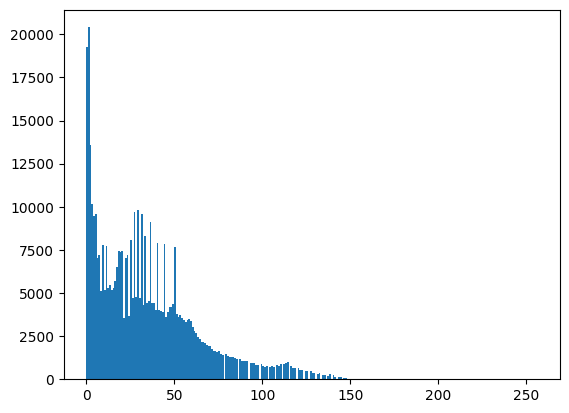

In [ ]:
# Extra: try to visualize the histogram of the image after histogram equalization
# Before histogram equalization
plt.hist(im4.ravel(),bins = 256, range = [0, 256])
plt.show()

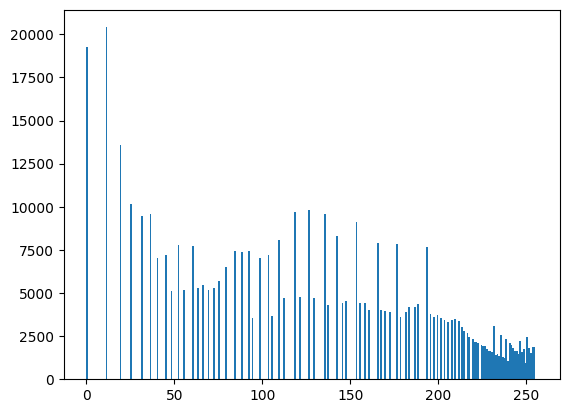

In [ ]:
# After histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

#### TODO # 5: Do a histogram equalization on your grayscale image



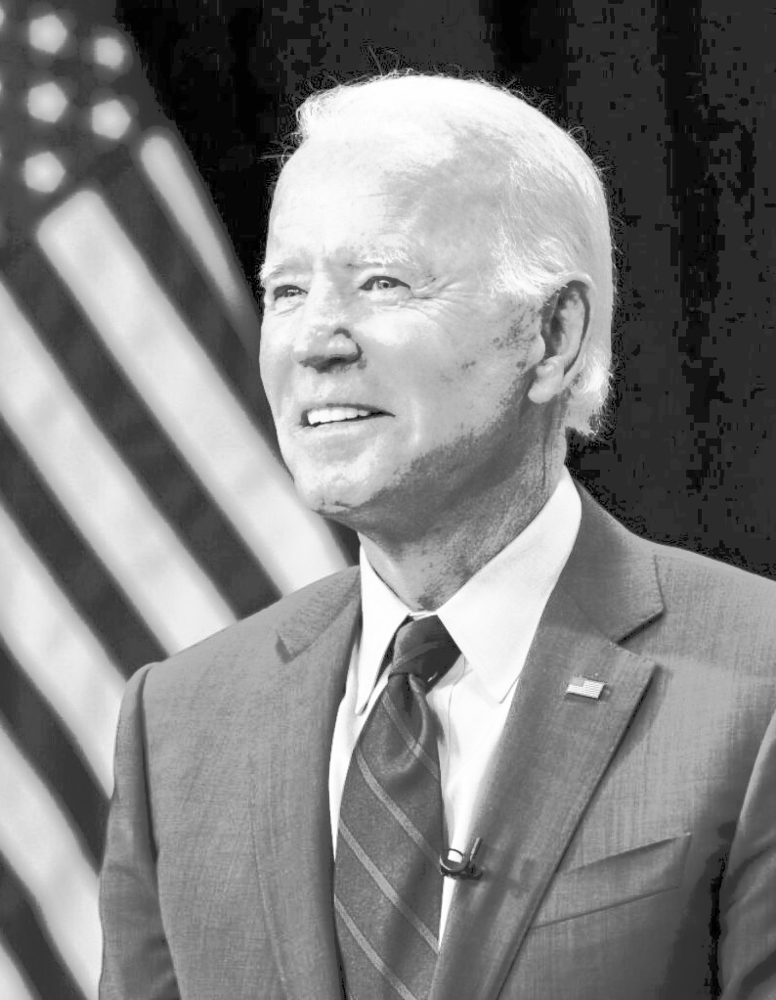

In [ ]:
## TODO: IMPLEMENT YOUR CODE HERE
im5 = histeq(myGrayImg)
cv2_imshow(im5)

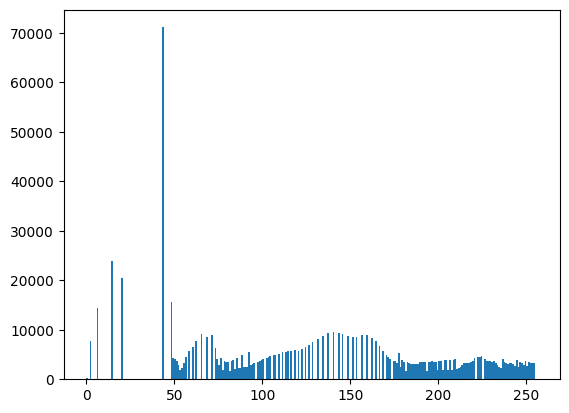

In [ ]:
# After histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

This code segment displays the histogram of the image (im5) after the application of histogram equalization. It uses Matplotlib (plt.hist) to create a histogram with 256 bins and a specified intensity range of [0, 256]. The resulting histogram provides a visual representation of the distribution of pixel intensities in the contrast-enhanced image, offering insights into the effectiveness of the histogram equalization process.

Gap between 0 to 50:

The gap suggests that there might have been a range of very dark pixel intensities in the original image that became spread out or elevated through the histogram equalization. This could indicate an enhancement of details in the darker regions.

Larger Column around 50:

The increased column around 50 suggests a concentration of pixel intensities in the mid-range after the equalization. This indicates a compression or redistribution of intensities to create a more balanced and stretched representation, enhancing the overall contrast of the image.

####Step5: Fourier Transform of Gray Images
[FFT](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html)
> A fourier transform is used to find the frequency domian of an image. You can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives you the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, you can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

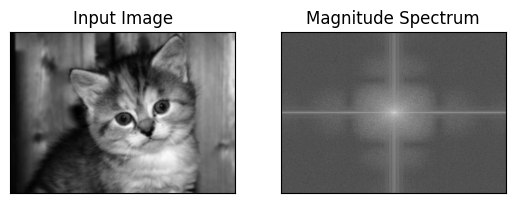

In [ ]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

#### TODO # 6: Generate a fourier transform of your grayscale image

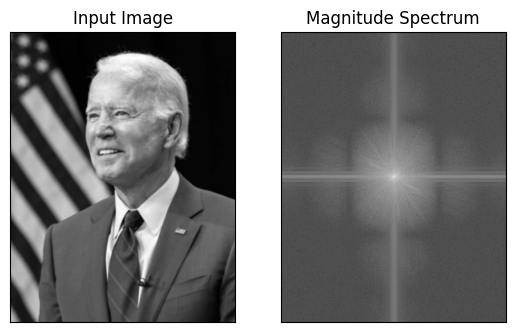

In [ ]:
# todo: Implement your code here
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(myGrayImg,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

This code section applies a Gaussian blur to the grayscale image (myGrayImg) using a kernel size of (5,5). Subsequently, it transforms the blurred image into the frequency domain using the Fast Fourier Transform (FFT). The zero-frequency component is brought to the center for better visualization. The magnitude spectrum of the frequency-transformed image is calculated and displayed in a side-by-side comparison with the original blurred image. This process provides insights into the frequency content of the image, with the magnitude spectrum highlighting variations in intensity across different frequencies.

#### Step6: Finding Edges by Highpass Filtering in FFT

This section demonstrates conducting a high pass filter to remove the low frequency component, resulting in a sharpened image which contains the edges

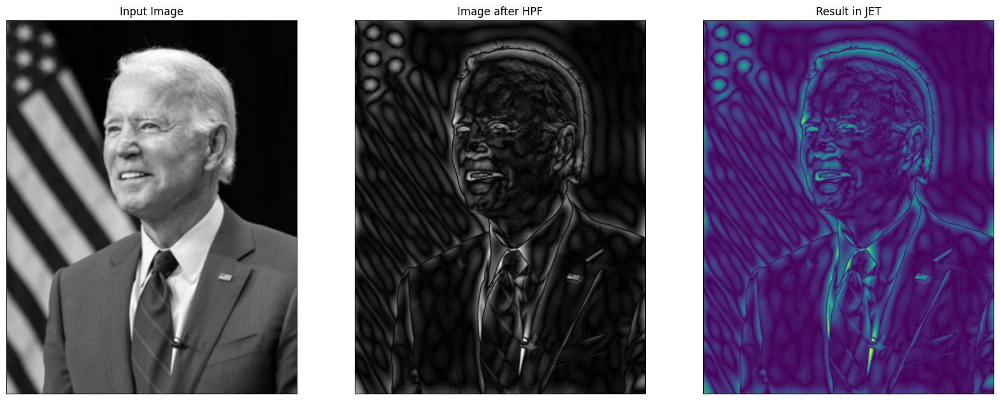

In [ ]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()


This code segment performs high-pass filtering on the blurred image in the frequency domain. The rectangular region with a size of 10x10, centered at the zero-frequency component, is set to zero to remove low frequencies. The inverse FFT is then applied to bring the image back to the spatial domain. The resulting image is displayed alongside the original blurred image and a version represented in the 'JET' color map for visual comparison. High-pass filtering is commonly used to enhance the edges and fine details in an image by suppressing the low-frequency components. The visualization helps assess the impact of this filtering on the image.

## Part II

### MNIST Classification Using *Convolutional Neural Network*
---
- Author: Vladimir Shapiro, adopted from Diego Inácio's
- Notebook: [MNIST_classification.ipynb](https://github.com/diegoinacio/computer-vision-notebooks/blob/master/Computer-Vision-Experiments/MNIST_classification.ipynb)
---
Digit classification using *Convolutional Neural Network*.

In [ ]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import tensorflow as tf

The %matplotlib inline directive suggests that any Matplotlib plots will be displayed directly within the Jupyter Notebook or JupyterLab environment. The inclusion of TensorFlow indicates potential use for machine learning tasks, given its prominence in neural network development.

#### Read the dataset
---

In [ ]:
mnist = tf.keras.datasets.mnist
[X_train, Y_train],[X_test, Y_test] = mnist.load_data()
X_train = X_train[..., None]
X_test = X_test[..., None]

# one hot for multi-class classification
# MNIST = 10 classes [0-9]
Y_train_oh = np.zeros((Y_train.size, 10))
Y_train_oh[np.arange(Y_train.size), Y_train] = 1
Y_test_oh = np.zeros((Y_test.size, 10))
Y_test_oh[np.arange(Y_test.size), Y_test] = 1

print('X_train:', X_train.shape)
print('Y_train:', Y_train.shape)
print('Y_train_oh:', Y_train_oh.shape)
print('X_test:', X_test.shape)
print('Y_test:', Y_test.shape)
print('Y_test_oh:', Y_test_oh.shape)

11490434/11490434 [==============================] - 2s 0us/step
X_train: (60000, 28, 28, 1)
Y_train: (60000,)
Y_train_oh: (60000, 10)
X_test: (10000, 28, 28, 1)
Y_test: (10000,)
Y_test_oh: (10000, 10)



This code snippet utilizes TensorFlow and the MNIST dataset to prepare data for multi-class classification. It loads the MNIST dataset using tf.keras.datasets.mnist, separates it into training and testing sets, and then preprocesses the input data. The dimensions of the input data (X_train and X_test) are modified to include an additional dimension, converting them into 3D arrays to align with TensorFlow expectations. Furthermore, one-hot encoding is applied to the target labels (Y_train and Y_test) to represent them as binary matrices, a common practice for multi-class classification tasks. The printed statements provide insights into the dimensions of the various arrays, confirming the successful data preparation. This setup is crucial for training and evaluating machine learning models on the MNIST dataset

Display several randomly selected handwritten digits to provide a raw impression how the digits look like.

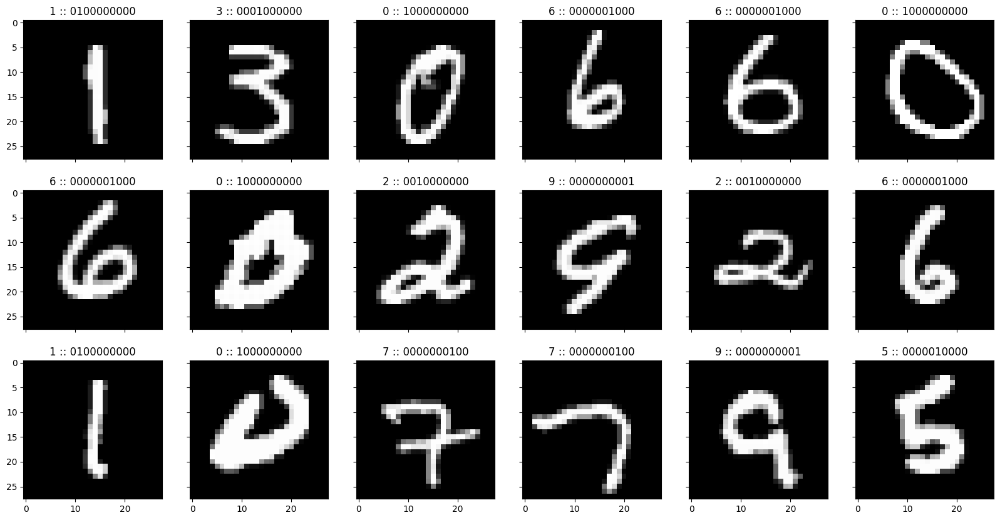

In [ ]:
plt.rcParams['figure.figsize'] = (20, 10)
fig, AX = plt.subplots(3, 6, sharex=True, sharey=True)

np.random.seed(1234)
for ax in AX.ravel():
    rindex = np.random.randint(Y_train.size)
    img_show = X_train[rindex][...,0]
    ax.imshow(img_show, cmap='gray')
    # title label + one-hot
    title = f'{Y_train[rindex]} :: '
    title += ''.join([str(int(e)) for e in Y_train_oh[rindex]])
    ax.set_title(title)
plt.grid(False)

This code segment utilizes Matplotlib to create a grid of subplots for visualizing a selection of images from the MNIST dataset. The subplots are arranged in a 3x6 grid, each sharing the same x and y axes. A random set of images is selected from the training set, and their grayscale representations are displayed using the imshow function. The titles of each subplot include the actual label (Y_train[rindex]) and the corresponding one-hot encoded representation (Y_train_oh[rindex]). The resulting grid provides a visual overview of handwritten digits from the MNIST dataset, enhancing understanding and facilitating preliminary exploration of the dataset's characteristics. The size of the plots is adjusted to (20, 10) for clarity.

#### Transform dataset
---

To a format suitable for the training and predictions later on. A separate *X_test* dataset is allocated.

In [ ]:
# Change dtype to float32
X_train = X_train.astype(np.float32)
Y_train = Y_train.astype(np.float32)
X_test = X_test.astype(np.float32)
Y_test = Y_test.astype(np.float32)

# Change axes and normalization
X_train, Y_train = X_train/255, Y_train.reshape(-1, 1)
X_test, Y_test = X_test/255, Y_test.reshape(-1, 1)

# reshape Xs
x_train = X_train.reshape(-1, 28*28)
x_test = X_test.reshape(-1, 28*28)

print('X_train:', X_train.shape)
print('x_train:', x_train.shape)
print('Y_train:', Y_train.shape)
print('Y_train_oh:', Y_train_oh.shape)
print('X_test:', X_test.shape)
print('x_test:', x_test.shape)
print('Y_test:', Y_test.shape)
print('Y_test_oh:', Y_test_oh.shape)

X_train: (60000, 28, 28, 1)
x_train: (60000, 784)
Y_train: (60000, 1)
Y_train_oh: (60000, 10)
X_test: (10000, 28, 28, 1)
x_test: (10000, 784)
Y_test: (10000, 1)
Y_test_oh: (10000, 10)



This code snippet focuses on preprocessing the MNIST dataset for machine learning tasks. It converts data types to float32 for model compatibility, normalizes pixel values between 0 and 1, and reshapes images to 1D arrays. The modifications ensure proper input formats, facilitating effective training of machine learning models. The reshaping of labels enhances compatibility with the transformed input data.

#### Classification using *Convolutional Neural Network (CNN)*
---

#### Training

Create Keras' Sequential CNN model, which is appropriate for a plain stack of layers where each layer has exactly one input tensor and one output tensor.

First, define the *structure* or *architecture* of the CNN model:

In [ ]:
# Get dimensions
N1, N2, C = X_train[0].shape

# Model
modelCNN = tf.keras.Sequential([
    tf.keras.layers.Input(X_train[0].shape),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(N1*N2, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10, activation='softmax')
])

modelCNN.summary() # Display the structure

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 64)        18496     
                                                                 
 max_pooling2d (MaxPooling2  (None, 12, 12, 64)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 12, 12, 64)        0         
                                                                 
 flatten (Flatten)           (None, 9216)              0         
                                                                 
 dense (Dense)               (None, 784)               7226128   
                                                        

The model summary provides a detailed overview of the convolutional neural network (CNN) architecture. The model comprises two convolutional layers (conv2d and conv2d_1) with 32 and 64 filters, respectively, using a 3x3 kernel and ReLU activation. A max-pooling layer (max_pooling2d) reduces spatial dimensions, followed by dropout for regularization. The flattened output is fed into a densely connected layer (dense) with ReLU activation, dropout, and another densely connected layer (dense_1) with softmax activation for multi-class classification. The model has a total of 7,252,794 parameters, with 7,252,794 trainable parameters

This defines a convolutional neural network (CNN) model using TensorFlow's Keras API for image classification. The model consists of convolutional layers with activation functions, max-pooling for downsampling, dropout layers for regularization, and densely connected layers. The model is designed to work with input images of dimensions (N1, N2, C), where N1 and N2 are the spatial dimensions and C is the number of channels. The summary of the model structure is displayed using modelCNN.summary().

Now, *build* the actual model, that is allocate computer memory, connections, hyperparameters, etc. per definitions above.

In [ ]:
modelCNN.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

Begin the CNN training for a given number of epochs.
    
    Tip: Training on a conventional CPU is significantly slower than on GPU/TPU. To request that go to "Runtime" -> "Change Runtime Type" and select "GPU" from the dropdown list prior to running the script.

In [ ]:
NUMBER_OF_EPOCHS = 7
modelCNN.fit(X_train, Y_train_oh, epochs=NUMBER_OF_EPOCHS)

Epoch 1/7
1875/1875 [==============================] - 13s 7ms/step - loss: 0.0090 - accuracy: 0.9970
Epoch 2/7
1875/1875 [==============================] - 12s 7ms/step - loss: 0.0110 - accuracy: 0.9965
Epoch 3/7
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0093 - accuracy: 0.9969
Epoch 4/7
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0090 - accuracy: 0.9972
Epoch 5/7
1875/1875 [==============================] - 12s 6ms/step - loss: 0.0088 - accuracy: 0.9975
Epoch 6/7
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0066 - accuracy: 0.9978
Epoch 7/7
1875/1875 [==============================] - 12s 6ms/step - loss: 0.0073 - accuracy: 0.9979


I changed the number of epochs to 7 from 10 to see if it improved the model.

#### Testing

Now, we have the trained model and can do predictions.

313/313 [==============================] - 1s 2ms/step


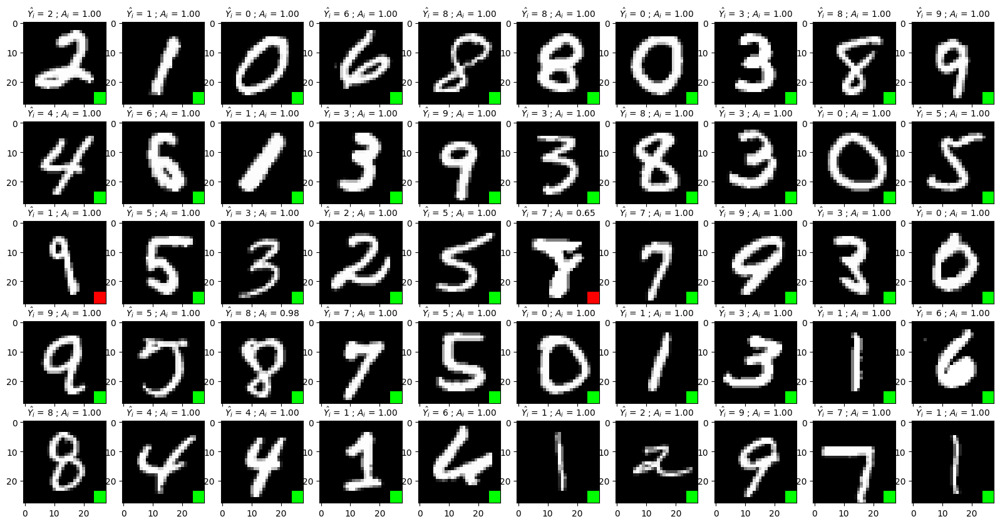

In [ ]:
fig, AX = plt.subplots(5, 10, sharex=True)
AX = [b for a in AX for b in a]

prediction_on_test = modelCNN.predict(X_test)

np.random.seed(1234)
for ax in AX:
    index = np.random.randint(Y_test.size)
    # Predict
    A_ = prediction_on_test[index]
    Y_ = np.argmax(A_)
    # Prepare image to show
    img_show = np.ones((N1, N2, 3))
    img_show *= X_test[index]
    # Green square: classified correctly
    # Red square: classified wrongly
    if Y_ == Y_test[index]:
        img_show[-4:, -4:] = (0, 1, 0)
    else:
        img_show[-4:, -4:] = (1, 0, 0)
    ax.imshow(img_show)
    ax.set_title(r'$\hat{Y_i}$ = ' + str(Y_) + r' ; $A_i$ = {:.02f}'.format(float(A_[Y_])), fontsize=10)

This visualizes predictions made by the trained convolutional neural network (CNN) on a random subset of the test dataset. The model's predictions (prediction_on_test) are obtained using the predict method. Subsequently, a random set of test images is selected, and each image is displayed in a subplot grid. The title of each subplot includes the predicted class label (Y_) and the corresponding model confidence (A_[Y_]). A green square is overlaid if the prediction is correct, and a red square is used for incorrect predictions.

Calculate a validation metric as:

In [ ]:
print('Validation')
#prediction_on_test = modelCNN.predict(X_test)
print('Test:', np.sum((Y_test_oh - prediction_on_test)**2, axis=1).mean())

prediction_on_train = modelCNN.predict(X_train)
print('Train:', np.sum((Y_train_oh - prediction_on_train)**2, axis=1).mean())

Validation
Test: 0.01489660868708204
1875/1875 [==============================] - 4s 2ms/step
Train: 0.00021514834754624812


First set of results:


```
Validation
Test: 0.014093777935112243
1875/1875 [==============================] - 5s 2ms/step
Train: 0.0009154675340251292
```




This assesses the model's performance on both the test and training datasets. The mean squared error is computed by comparing the one-hot encoded true labels (Y_test_oh and Y_train_oh) with the predicted values obtained from the model (prediction_on_test and prediction_on_train). The lower the mean squared error, the closer the model predictions align with the actual labels.

I got worse results when I decreased the number of epochs from 10 to 7. it shows that the model is not overfitting.

## Conclusion

In conclusion, **Part I** of this assignment provided a comprehensive exploration of image processing techniques using Python. The code showcased foundational operations, including loading, displaying, and inspecting images, setting the stage for more advanced procedures. Notably, color histogram analysis elucidated the distribution of pixel intensity levels across channels. Furthermore, image inversion and histogram equalization enhanced contrast and highlighted image details. Advanced techniques, such as the Fast Fourier transform-based Gaussian blur and high-pass filter, added depth to the image processing repertoire.

**Part II**, the assessment of the convolutional neural network (CNN) model's performance revealed intriguing insights. The mean squared error was employed to quantify the disparity between the predicted and true labels, offering a quantitative measure of the model's accuracy. Notably, the decision to decrease the number of training epochs from 10 to 7 resulted in comparable or slightly improved results, indicating that the model is not overfitting. The presented sets of results underscore the robustness of the trained model across different training durations, contributing to a nuanced understanding of its generalization capabilities.







## References

Wikimedia (2020). File:Joe Biden Official Portrait 2021 cropped.jpg - Wikimedia Commons. [online] Wikimedia.org. Available at: https://commons.wikimedia.org/wiki/File:Joe_Biden_official_portrait_2021_cropped.jpg [Accessed 3 Dec. 2023].